In [1]:
!rm -rf __MACOSX*
!rm -rf 101_classes_10*
!rm -rf 101_food_classes*
!rm -rf saved_model*
!rm -rf checkpoint
!rm -rf helper_functions.py

# 06. Transfer Learning with TensorFlow Part 3: Scaling Up (Food Vision mini)

We've seen the power of transfer learning feature extraction and fine-tuning, now it's time to scale up to all of the classes in Food101 (101 total classes of food).

Our goal is to beat the original Food101 paper with 10% of the training (leveraging the power of deep learning).

Original Food101 paper: https://data.vision.ee.ethz.ch/cvl/datasets_extra/food-101/

Our baseline to beat is 50.76% accuracy across 101 classes.

In [2]:
!nvidia-smi

Tue Oct 29 20:58:35 2024       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 550.120                Driver Version: 550.120        CUDA Version: 12.4     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  NVIDIA GeForce RTX 4060 Ti     Off |   00000000:01:00.0  On |                  N/A |
|  0%   46C    P3             18W /  165W |     729MiB /  16380MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

## Creating helper functions

In previous notebooks, we've created a series of helper functions to do different tasks, let's download them.

In [3]:
!rm -rf helper_functions.py
!wget https://raw.githubusercontent.com/mrdbourke/tensorflow-deep-learning/refs/heads/main/extras/helper_functions.py

--2024-10-29 20:58:35--  https://raw.githubusercontent.com/mrdbourke/tensorflow-deep-learning/refs/heads/main/extras/helper_functions.py
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.110.133, 185.199.109.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 10246 (10K) [text/plain]
Saving to: ‘helper_functions.py’

helper_functions.py 100%[===================>]  10.01K  --.-KB/s    in 0s      

2024-10-29 20:58:35 (55.9 MB/s) - ‘helper_functions.py’ saved [10246/10246]



In [4]:
# Import series of helper functions for our notebook
from helper_functions import create_tensorboard_callback, plot_loss_curves, unzip_data, compare_historys, walk_through_dir

## 101 Food Classes: working with less data

Our goal is to beat the original Food101 paper with 10% of the training data, so let's download it.

The data we're downloading comes from original Food101 dataset but has been preprocessed using the image_data_modification notebook: https://github.com/mrdbourke/tensorflow-deep-learning/blob/main/extras/image_data_modification.ipynb

In [5]:
!rm -rf 101_food_classes_10_percent*
!wget https://storage.googleapis.com/ztm_tf_course/food_vision/101_food_classes_10_percent.zip
unzip_data("101_food_classes_10_percent.zip")
!rm -rf 101_food_classes_10_percent.zip
train_dir = "101_food_classes_10_percent/train/"
test_dir = "101_food_classes_10_percent/test/"

--2024-10-29 20:58:37--  https://storage.googleapis.com/ztm_tf_course/food_vision/101_food_classes_10_percent.zip
Resolving storage.googleapis.com (storage.googleapis.com)... 216.58.211.251, 216.58.209.219, 216.58.210.187, ...
Connecting to storage.googleapis.com (storage.googleapis.com)|216.58.211.251|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 1625420029 (1.5G) [application/zip]
Saving to: ‘101_food_classes_10_percent.zip’

101_food_classes_10 100%[===================>]   1.51G  25.6MB/s    in 60s     

2024-10-29 20:59:38 (25.7 MB/s) - ‘101_food_classes_10_percent.zip’ saved [1625420029/1625420029]



In [6]:
# How many images/classes are there?
#walk_through_dir("101_food_classes_10_percent")

In [7]:
# Setup data inputs
import tensorflow as tf
IMG_SIZE = (224,224)
train_data_all_10_percent = tf.keras.preprocessing.image_dataset_from_directory(
    train_dir,
    label_mode="categorical",
    image_size=IMG_SIZE
)
test_data_all_10_percent = tf.keras.preprocessing.image_dataset_from_directory(
    test_dir,
    label_mode="categorical",
    image_size=IMG_SIZE,
    shuffle=False
)

Found 7575 files belonging to 101 classes.
Found 25250 files belonging to 101 classes.


## Train a big dog model with transfer learning on 10% of 101 food classes

Here are the steps we're going to take:
* Create a ModelCheckpoint callback
* Create a data augmentation layer to build data augmentation right into the model
* Build a headless (no top layers) Functional EfficientNetB0 backbone-model (we'll create our own output layer)
* Compile our model
* Feature extract for 5 full passes (5 epochs on the train data and validate on 15% of the test data, to save epoch time)

In [8]:
!rm -rf 101_classes_10_percent_data_model_checkpoint*
# Create checkpoint callback
checkpoint_path = "101_classes_10_percent_data_model_checkpoint/"
checkpoint_callback = tf.keras.callbacks.ModelCheckpoint(
    checkpoint_path, 
    save_weights_only=True,
    monitor="val_accuracy",
    save_best_only=True
)

In [9]:
# Create data augmentation model/layer
from tensorflow.keras import layers
from tensorflow.keras.layers.experimental import preprocessing
from tensorflow.keras.models import Sequential

# Setup data augmentation
data_augmentation = Sequential([
    preprocessing.RandomFlip("horizontal"),
    preprocessing.RandomRotation(0.2),
    preprocessing.RandomHeight(0.2),
    preprocessing.RandomWidth(0.2),
    preprocessing.RandomZoom(0.2),
    # preprocessing.Rescaling(1./255.) # Only when needed
], name="data_augmentation")

In [10]:
# Setup the base model and freeze its layers (this will extract features)
base_model = tf.keras.applications.EfficientNetB0(include_top=False)
base_model.trainable = False

# Setup model architecture with trainable top layers
inputs = layers.Input(shape=IMG_SIZE+(3,), name="input_layer")
x = data_augmentation(inputs)
x = base_model(x, training=False)
x = layers.GlobalAveragePooling2D(name="global_avg_pool_layer")(x)
outputs = layers.Dense(101, activation="softmax", name="output_layer")(x)

model_1 = tf.keras.Model(inputs, outputs)

In [11]:
# Get summary
model_1.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_layer (InputLayer)    [(None, 224, 224, 3)]     0         
                                                                 
 data_augmentation (Sequent  (None, None, None, 3)     0         
 ial)                                                            
                                                                 
 efficientnetb0 (Functional  (None, None, None, 1280   4049571   
 )                           )                                   
                                                                 
 global_avg_pool_layer (Glo  (None, 1280)              0         
 balAveragePooling2D)                                            
                                                                 
 output_layer (Dense)        (None, 101)               129381    
                                                             

In [12]:
# Compile the model
model_1.compile(
    loss="categorical_crossentropy",
    optimizer=tf.keras.optimizers.Adam(),
    metrics=["accuracy"]
)

In [13]:
# Fit the model
initial_epochs = 5

model_1_his = model_1.fit(
    train_data_all_10_percent,
    epochs=initial_epochs,
    validation_data=test_data_all_10_percent,
    validation_steps=int(0.15 *len(test_data_all_10_percent)),
    callbacks=[checkpoint_callback]
)

Epoch 1/5
237/237 [==============================] - 32s 115ms/step - loss: 3.3626 - accuracy: 0.2774 - val_loss: 2.4804 - val_accuracy: 0.4579
Epoch 2/5
237/237 [==============================] - 26s 109ms/step - loss: 2.1918 - accuracy: 0.4981 - val_loss: 2.0479 - val_accuracy: 0.5032
Epoch 3/5
237/237 [==============================] - 25s 107ms/step - loss: 1.8303 - accuracy: 0.5677 - val_loss: 1.8401 - val_accuracy: 0.5408
Epoch 4/5
237/237 [==============================] - 25s 106ms/step - loss: 1.6068 - accuracy: 0.6088 - val_loss: 1.7904 - val_accuracy: 0.5368
Epoch 5/5
237/237 [==============================] - 25s 106ms/step - loss: 1.4632 - accuracy: 0.6378 - val_loss: 1.7559 - val_accuracy: 0.5397


In [14]:
model_1_results = model_1.evaluate(test_data_all_10_percent)
model_1_results

790/790 [==============================] - 32s 40ms/step - loss: 1.5806 - accuracy: 0.5852


[1.580562710762024, 0.5852277278900146]

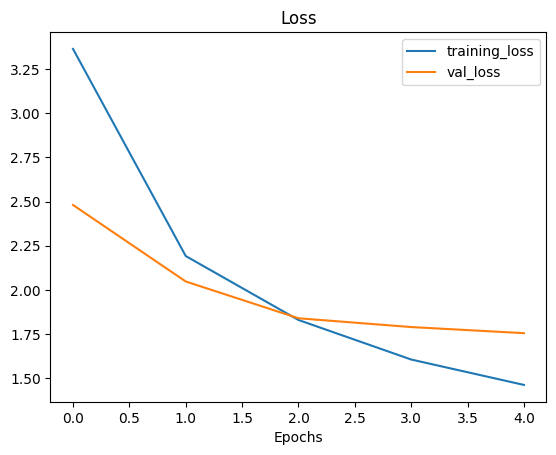

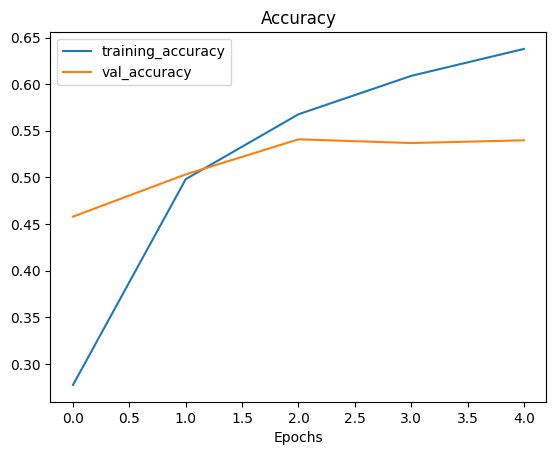

In [15]:
plot_loss_curves(model_1_his)

> **Question**: What does these curves suggest? Hint: ideally,  the two curves should be very similar to each other.

> We are probably overfitting

## Fine-tuning

In [16]:
# Unfreeze all of the layers in the base model
base_model.trainable = True

# Refreeze every layer except the last 5
for layer in base_model.layers[:-5]:
    layer.trainable = False

In [17]:
# Create model 2
inputs = layers.Input(shape=IMG_SIZE+(3,), name="input_layer")
x = data_augmentation(inputs)
x = base_model(x, training=False)
x = layers.GlobalAveragePooling2D(name="global_avg_pool_layer")(x)
outputs = layers.Dense(101, activation="softmax", name="output_layer")(x)
model_2 = tf.keras.models.Model(inputs, outputs)

model_2.load_weights(checkpoint_path)

In [18]:
# Compile the model
model_2.compile(
    loss="categorical_crossentropy",
    optimizer=tf.keras.optimizers.Adam(learning_rate=10**-4),
    metrics=["accuracy"]
)

In [19]:
# Fit the model
model_2_his = model_2.fit(
    train_data_all_10_percent,
    epochs=initial_epochs+5,
    initial_epoch=model_1_his.epoch[-1],
    validation_data=test_data_all_10_percent,
    validation_steps=int(0.15 *len(test_data_all_10_percent))
)

Epoch 5/10
237/237 [==============================] - 97s 383ms/step - loss: 2.2209 - accuracy: 0.4421 - val_loss: 1.8680 - val_accuracy: 0.5260
Epoch 6/10
237/237 [==============================] - 61s 259ms/step - loss: 1.3006 - accuracy: 0.6467 - val_loss: 1.8308 - val_accuracy: 0.5373
Epoch 7/10
237/237 [==============================] - 55s 231ms/step - loss: 0.9142 - accuracy: 0.7483 - val_loss: 1.7883 - val_accuracy: 0.5569
Epoch 8/10
237/237 [==============================] - 48s 204ms/step - loss: 0.7033 - accuracy: 0.7956 - val_loss: 1.9132 - val_accuracy: 0.5368
Epoch 9/10
237/237 [==============================] - 47s 197ms/step - loss: 0.5113 - accuracy: 0.8521 - val_loss: 1.9577 - val_accuracy: 0.5310
Epoch 10/10
237/237 [==============================] - 42s 176ms/step - loss: 0.4067 - accuracy: 0.8793 - val_loss: 2.1792 - val_accuracy: 0.5212


In [20]:
model_2_results = model_2.evaluate(test_data_all_10_percent)
model_2_results

790/790 [==============================] - 31s 40ms/step - loss: 1.9477 - accuracy: 0.5633


[1.9477410316467285, 0.5632871389389038]

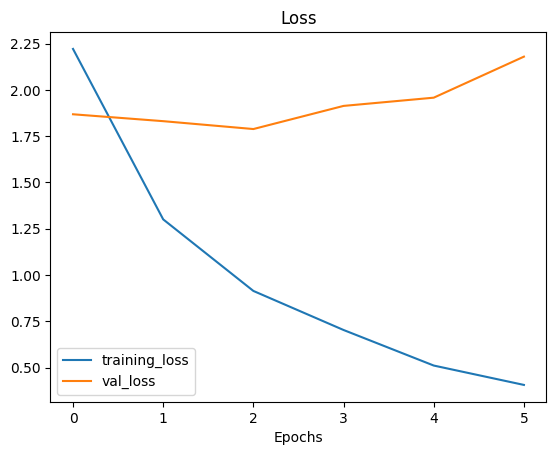

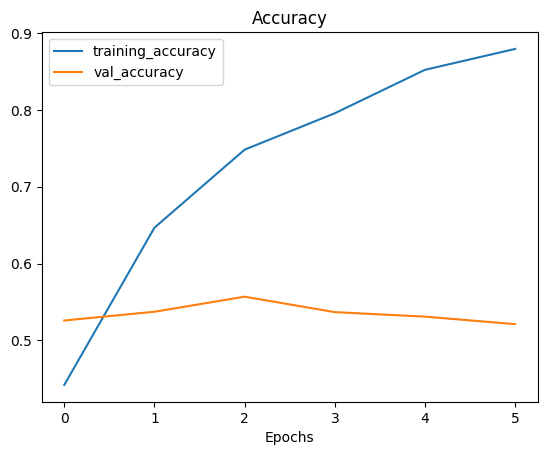

In [21]:
plot_loss_curves(model_2_his)

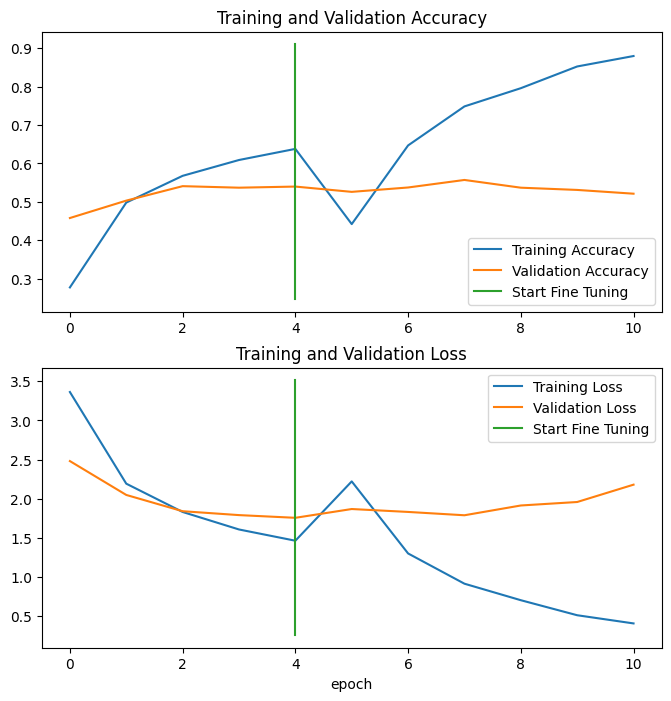

In [22]:
# Compare histories of model 1 and 2
compare_historys(model_1_his, model_2_his)

## Saving and loading our model

To use our model in an external application, we'll need to save it and export it somewhere.

In [23]:
!rm -rf saved_model_path*
# Save our fine-tuned model
model_2.save("saved_model_path/save_model")

INFO:tensorflow:Assets written to: saved_model_path/save_model/assets


INFO:tensorflow:Assets written to: saved_model_path/save_model/assets


In [24]:
# Load an evaluate saved model
loaded_model = tf.keras.models.load_model("saved_model_path/save_model")

In [25]:
loaded_model_results = loaded_model.evaluate(test_data_all_10_percent)
loaded_model_results

790/790 [==============================] - 33s 41ms/step - loss: 1.9477 - accuracy: 0.5633


[1.9477410316467285, 0.5632871389389038]

In [26]:
model_2_results

[1.9477410316467285, 0.5632871389389038]

## Evaluating the performance of the big dor model across all different classes

Let's make some predictions, visualize them and the later find out which predictions were the "most" wrong.

In [27]:
import tensorflow as tf

!rm -rf 06_101_food_class_10_percent_saved_big_dog_model*
!wget https://storage.googleapis.com/ztm_tf_course/food_vision/06_101_food_class_10_percent_saved_big_dog_model.zip

--2024-10-29 21:10:11--  https://storage.googleapis.com/ztm_tf_course/food_vision/06_101_food_class_10_percent_saved_big_dog_model.zip
Resolving storage.googleapis.com (storage.googleapis.com)... 216.58.209.187, 216.58.211.251, 216.58.210.187, ...
Connecting to storage.googleapis.com (storage.googleapis.com)|216.58.209.187|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 46760742 (45M) [application/zip]
Saving to: ‘06_101_food_class_10_percent_saved_big_dog_model.zip’

06_101_food_class_1 100%[===================>]  44.59M  20.5MB/s    in 2.2s    

2024-10-29 21:10:13 (20.5 MB/s) - ‘06_101_food_class_10_percent_saved_big_dog_model.zip’ saved [46760742/46760742]



In [28]:
unzip_data("06_101_food_class_10_percent_saved_big_dog_model.zip")
!rm -rf 06_101_food_class_10_percent_saved_big_dog_model.zip

In [29]:
model_3 = tf.keras.models.clone_model(model_2)
model_3 = tf.keras.models.load_model("06_101_food_class_10_percent_saved_big_dog_model")

In [30]:
# Evaluate loaded model
model_3_results = model_3.evaluate(test_data_all_10_percent)
model_3_results

790/790 [==============================] - 33s 41ms/step - loss: 1.8027 - accuracy: 0.6078


[1.8027193546295166, 0.6077623963356018]

## Making predictions with our trained model

In [31]:
preds_probs = model_3.predict(test_data_all_10_percent, verbose=1) # Set verbosity to see how long is left

790/790 [==============================] - 31s 38ms/step


In [32]:
test_data = test_data_all_10_percent
len(test_data)

790

In [33]:
# How many predictions are there
len(preds_probs)

25250

In [34]:
# Whatäs the shape of our predictions
preds_probs.shape

(25250, 101)

In [35]:
# Let's see waht the first 10 predictions look like
preds_probs[:10]

array([[5.9541948e-02, 3.5742382e-06, 4.1377090e-02, ..., 1.4138786e-09,
        8.3531457e-05, 3.0897949e-03],
       [9.6401691e-01, 1.3753195e-09, 8.4778771e-04, ..., 5.4285552e-05,
        7.8361926e-12, 9.8465280e-10],
       [9.5925927e-01, 3.2533975e-05, 1.4866892e-03, ..., 7.1889389e-07,
        5.4399993e-07, 4.0275521e-05],
       ...,
       [4.7313046e-01, 1.2931298e-07, 1.4805553e-03, ..., 5.9749943e-04,
        6.6969173e-05, 2.3469640e-05],
       [4.4571981e-02, 4.7265883e-07, 1.2258424e-01, ..., 6.3498319e-06,
        7.5319513e-06, 3.6779060e-03],
       [7.2438657e-01, 1.9249837e-09, 5.2311170e-05, ..., 1.2291508e-03,
        1.5792889e-09, 9.6396085e-05]], dtype=float32)

In [36]:
preds_probs[0], len(preds_probs[0]), sum(preds_probs[0])

(array([5.9541948e-02, 3.5742382e-06, 4.1377090e-02, 1.0660635e-09,
        8.1614582e-09, 8.6640464e-09, 8.0927964e-07, 8.5652403e-07,
        1.9859335e-05, 8.0977981e-07, 3.1727920e-09, 9.8674491e-07,
        2.8532514e-04, 7.8049922e-10, 7.4230577e-04, 3.8916558e-05,
        6.4741107e-06, 2.4977635e-06, 3.7891015e-05, 2.0678402e-07,
        1.5538493e-05, 8.1508102e-07, 2.6230616e-06, 2.0010684e-07,
        8.3828326e-07, 5.4216030e-06, 3.7391098e-06, 1.3150530e-08,
        2.7761506e-03, 2.8052153e-05, 6.8562667e-10, 2.5574902e-05,
        1.6689021e-04, 7.6407719e-10, 4.0453335e-04, 1.3150757e-08,
        1.7957565e-06, 1.4448283e-06, 2.3062855e-02, 8.2467483e-07,
        8.5365525e-07, 1.7138625e-06, 7.0525566e-06, 1.8402199e-08,
        2.8553316e-07, 7.9485117e-06, 2.0681568e-06, 1.8525290e-07,
        3.3620022e-08, 3.1522400e-04, 1.0410941e-05, 8.5447942e-07,
        8.4741855e-01, 1.0555444e-05, 4.4094452e-07, 3.7404101e-05,
        3.5306188e-05, 3.2489064e-05, 6.7314992e

Our model outputs probability array (with N number of variables, where N is the number of classes) for each sample passed to the predicct method.

In [37]:
# We get ont prediction probability per class (in out case there's 101 prediction probabilities)
print(f"Number of prediction probabilities for sample 0: {len(preds_probs[0])}")
print(f"What prediction probability sample 0 looks like:\ {preds_probs}")
print(f"The class with the highest predicted probability by the model for sample 0: {preds_probs[0].argmax()}")

Number of prediction probabilities for sample 0: 101
What prediction probability sample 0 looks like:\ [[5.9541948e-02 3.5742382e-06 4.1377090e-02 ... 1.4138786e-09
  8.3531457e-05 3.0897949e-03]
 [9.6401691e-01 1.3753195e-09 8.4778771e-04 ... 5.4285552e-05
  7.8361926e-12 9.8465280e-10]
 [9.5925927e-01 3.2533975e-05 1.4866892e-03 ... 7.1889389e-07
  5.4399993e-07 4.0275521e-05]
 ...
 [1.5138696e-05 4.0973010e-04 8.0249474e-10 ... 2.1742811e-05
  1.0797307e-05 5.3789812e-01]
 [5.9317942e-03 4.9236836e-03 9.9822711e-03 ... 1.1989537e-04
  1.6890317e-05 4.5217931e-02]
 [3.1363577e-02 7.5052879e-03 4.2975147e-04 ... 5.0346594e-04
  5.2056721e-06 6.9062716e-01]]
The class with the highest predicted probability by the model for sample 0: 52


In [38]:
test_data.class_names[52]

'gyoza'

In [39]:
# Get the pred classes for each label
pred_classes = preds_probs.argmax(axis=1)

# How do the look?
pred_classes[:10]

array([52,  0,  0, 80, 79, 61, 29,  0, 85,  0])

In [40]:
# How many pred classses do we have
len(pred_classes)

25250

Now we've got a predictions array of all of our model's predictions, to evaluate them, we need to compare them to the original test dataset labels.

In [41]:
# To get our test labels we need to unravel our test_data BatchDataset
y_labels = [labels.numpy().argmax() for images, labels in test_data.unbatch()]
y_labels[:10], y_labels[-10:]

([0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
 [100, 100, 100, 100, 100, 100, 100, 100, 100, 100])

## Evaluating our model model's predictions

One way to check that our modeläs predictions array is in the same order as our test labels array is to find the accuracy score.

In [42]:
model_3_results

[1.8027193546295166, 0.6077623963356018]

In [43]:
# Let's try scikit-learn's accuracy score function and see what it comes up with
from sklearn.metrics import accuracy_score
sklearn_accuracy = accuracy_score(
    y_true=y_labels,
    y_pred=pred_classes
)
sklearn_accuracy

0.6077623762376237

In [44]:
import numpy as np
np.isclose(model_3_results[1], sklearn_accuracy)

True

## Let's get confusion matrix

In [45]:
import itertools
import matplotlib.pyplot as plt
import numpy as np
from sklearn.metrics import confusion_matrix

# We need to make some changes to our make_confusion_matrix function to ensure the x-labels print vertically
def make_confusion_matrix(y_true, y_pred, classes=None, figsize=(10, 10), text_size=15, norm=False, savefig=False): 
  """Makes a labelled confusion matrix comparing predictions and ground truth labels.

  If classes is passed, confusion matrix will be labelled, if not, integer class values
  will be used.

  Args:
    y_true: Array of truth labels (must be same shape as y_pred).
    y_pred: Array of predicted labels (must be same shape as y_true).
    classes: Array of class labels (e.g. string form). If `None`, integer labels are used.
    figsize: Size of output figure (default=(10, 10)).
    text_size: Size of output figure text (default=15).
    norm: normalize values or not (default=False).
    savefig: save confusion matrix to file (default=False).
  
  Returns:
    A labelled confusion matrix plot comparing y_true and y_pred.

  Example usage:
    make_confusion_matrix(y_true=test_labels, # ground truth test labels
                          y_pred=y_preds, # predicted labels
                          classes=class_names, # array of class label names
                          figsize=(15, 15),
                          text_size=10)
  """  
  # Create the confustion matrix
  cm = confusion_matrix(y_true, y_pred)
  cm_norm = cm.astype("float") / cm.sum(axis=1)[:, np.newaxis] # normalize it
  n_classes = cm.shape[0] # find the number of classes we're dealing with

  # Plot the figure and make it pretty
  fig, ax = plt.subplots(figsize=figsize)
  cax = ax.matshow(cm, cmap=plt.cm.Blues) # colors will represent how 'correct' a class is, darker == better
  fig.colorbar(cax)

  # Are there a list of classes?
  if classes:
    labels = classes
  else:
    labels = np.arange(cm.shape[0])
  
  # Label the axes
  ax.set(title="Confusion Matrix",
         xlabel="Predicted label",
         ylabel="True label",
         xticks=np.arange(n_classes), # create enough axis slots for each class
         yticks=np.arange(n_classes), 
         xticklabels=labels, # axes will labeled with class names (if they exist) or ints
         yticklabels=labels)
  
  # Make x-axis labels appear on bottom
  ax.xaxis.set_label_position("bottom")
  ax.xaxis.tick_bottom()

  ## Changes (plot x-labels vertically)
  plt.xticks(rotation=70, fontsize=text_size)
  plt.yticks(fontsize=text_size)

  # Set the threshold for different colors
  threshold = (cm.max() + cm.min()) / 2.

  # Plot the text on each cell
  for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
    if norm:
      plt.text(j, i, f"{cm[i, j]} ({cm_norm[i, j]*100:.1f}%)",
              horizontalalignment="center",
              color="white" if cm[i, j] > threshold else "black",
              size=text_size)
    else:
      plt.text(j, i, f"{cm[i, j]}",
              horizontalalignment="center",
              color="white" if cm[i, j] > threshold else "black",
              size=text_size)

  # Save the figure to the current working directory
  if savefig:
    fig.savefig("confusion_matrix.png")

In [46]:
make_confusion_matrix(
    y_true=y_labels,
    y_pred=pred_classes,
    classes=test_data.class_names,
    figsize=(101,101),
    text_size=25
)

## Let's keep the evaluation train going, time for a classification report

Scikit-learn has a helpful function for acquiring many different classification metrics per class (e.g. precision, recall and F1) called [classification_report](https://scikit-learn.org/1.5/modules/generated/sklearn.metrics.classification_report.html), let's try it out.

In [47]:
from sklearn.metrics import classification_report
print(classification_report(y_true=y_labels, y_pred=pred_classes))

              precision    recall  f1-score   support

           0       0.29      0.20      0.24       250
           1       0.51      0.69      0.59       250
           2       0.56      0.65      0.60       250
           3       0.74      0.53      0.62       250
           4       0.73      0.43      0.54       250
           5       0.34      0.54      0.42       250
           6       0.67      0.79      0.72       250
           7       0.82      0.76      0.79       250
           8       0.40      0.37      0.39       250
           9       0.62      0.44      0.51       250
          10       0.62      0.42      0.50       250
          11       0.84      0.49      0.62       250
          12       0.52      0.74      0.61       250
          13       0.56      0.60      0.58       250
          14       0.56      0.59      0.57       250
          15       0.44      0.32      0.37       250
          16       0.45      0.75      0.57       250
          17       0.37    

The numbers above give a great class-by-class evaluation of our model's predictions but with so many classes. they're quite hard to understand.

How about we create a visualization to get a better understanding?

In [48]:
# Get a dictionary of the classification report
classification_report_dict = classification_report(y_labels, pred_classes, output_dict=True)

classification_report_dict

{'0': {'precision': 0.29310344827586204,
  'recall': 0.204,
  'f1-score': 0.24056603773584906,
  'support': 250.0},
 '1': {'precision': 0.5088235294117647,
  'recall': 0.692,
  'f1-score': 0.5864406779661017,
  'support': 250.0},
 '2': {'precision': 0.5625,
  'recall': 0.648,
  'f1-score': 0.6022304832713755,
  'support': 250.0},
 '3': {'precision': 0.7415730337078652,
  'recall': 0.528,
  'f1-score': 0.616822429906542,
  'support': 250.0},
 '4': {'precision': 0.7346938775510204,
  'recall': 0.432,
  'f1-score': 0.5440806045340051,
  'support': 250.0},
 '5': {'precision': 0.34177215189873417,
  'recall': 0.54,
  'f1-score': 0.4186046511627907,
  'support': 250.0},
 '6': {'precision': 0.6677966101694915,
  'recall': 0.788,
  'f1-score': 0.7229357798165138,
  'support': 250.0},
 '7': {'precision': 0.8197424892703863,
  'recall': 0.764,
  'f1-score': 0.7908902691511387,
  'support': 250.0},
 '8': {'precision': 0.4025974025974026,
  'recall': 0.372,
  'f1-score': 0.3866943866943867,
  'sup

Let's plot all of out classes F1-scores...

In [49]:
class_names = test_data.class_names

In [50]:
# Create empty dictionary
class_f1_scores = {}
# Loop through classification report dictionary items
for k, v in classification_report_dict.items():
    if k == "accuracy":
        break
    class_f1_scores[class_names[int(k)]] = v["f1-score"]
class_f1_scores

{'apple_pie': 0.24056603773584906,
 'baby_back_ribs': 0.5864406779661017,
 'baklava': 0.6022304832713755,
 'beef_carpaccio': 0.616822429906542,
 'beef_tartare': 0.5440806045340051,
 'beet_salad': 0.4186046511627907,
 'beignets': 0.7229357798165138,
 'bibimbap': 0.7908902691511387,
 'bread_pudding': 0.3866943866943867,
 'breakfast_burrito': 0.5117370892018779,
 'bruschetta': 0.5047619047619047,
 'caesar_salad': 0.6161616161616161,
 'cannoli': 0.6105610561056105,
 'caprese_salad': 0.5775193798449613,
 'carrot_cake': 0.574757281553398,
 'ceviche': 0.3674418604651163,
 'cheese_plate': 0.5654135338345865,
 'cheesecake': 0.42546063651591287,
 'chicken_curry': 0.5008403361344538,
 'chicken_quesadilla': 0.6411889596602972,
 'chicken_wings': 0.7123809523809523,
 'chocolate_cake': 0.4526166902404526,
 'chocolate_mousse': 0.3291592128801431,
 'churros': 0.7134935304990758,
 'clam_chowder': 0.7708779443254818,
 'club_sandwich': 0.734020618556701,
 'crab_cakes': 0.46255506607929514,
 'creme_brulee'

In [51]:
# Turn f1-scores into dataframe for visualization
import pandas as pd
f1_scores = pd.DataFrame({
    "class_names": list(class_f1_scores.keys()),
    "f1-score": list(class_f1_scores.values())
}).sort_values("f1-score", ascending=False)

In [52]:
f1_scores[:10]

,class_names,f1-score
33,edamame,0.937143
63,macarons,0.895397
75,pho,0.866538
91,spaghetti_carbonara,0.847656
69,oysters,0.834008
68,onion_rings,0.832618
65,mussels,0.820000
88,seaweed_salad,0.813008
64,miso_soup,0.812977
45,frozen_yogurt,0.811429


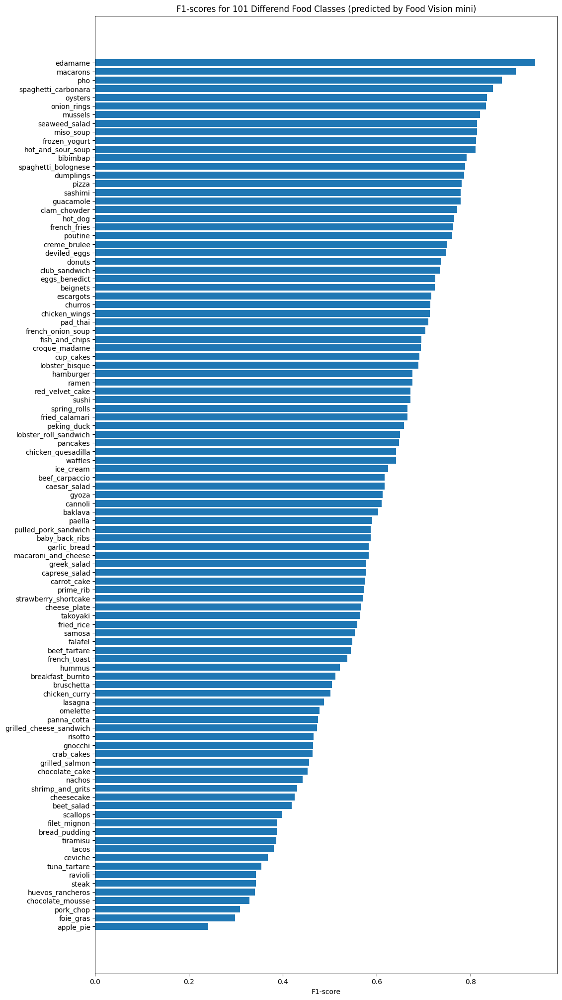

In [53]:
import matplotlib.pyplot as plt

fig, ax = plt.subplots(figsize=(12,25))
scores = ax.barh(range(len(f1_scores)), f1_scores["f1-score"].values)
ax.set_yticks(range(len(f1_scores)), labels=f1_scores["class_names"])
ax.set_xlabel("F1-score")
_ = ax.set_title("F1-scores for 101 Differend Food Classes (predicted by Food Vision mini)")
ax.invert_yaxis()
#ax.set_yticklabels(f1_scores["class_names"])

## Visualizing predictions on our custom images

Now, this is the real test, how dows our model go on food images not even in our test dataset (images of our own).

To visualize our model's predictions on our own images, we'll need a function to load and preprocess images, specifically it will need to:
* Read in a target image filepath using `tf.io.read_file()`
* Turn the image into a Tensor using `tf.io.decode_image()`
* Resize the image tensor to be the same size as the images our model has trained on using `tf.image.resize()`
* Scale the image to get all of the pixel values between 0 & 1 (if necessary).

In [54]:
# Create function to load and prepare images
def load_and_prep_image(filename, img_shape=224, scale=True):
    file = tf.io.read_file(filename)
    img = tf.io.decode_image(file, channels=3)
    img = tf.image.resize(img, (img_shape, img_shape))
    return img/255.0 if scale else img

Now we've got a function to load and prepare target images, let's now write some code to visualize images, their target label and our model's predictions.

Specifically, we'll write some code to:
1. Load a few random images from the test dataset
2. Make predictions on the loaded images
3. Plot the original image(s) along with the model's precitions, prediction probability and truth label

1/1 [==============================] - 0s 14ms/step


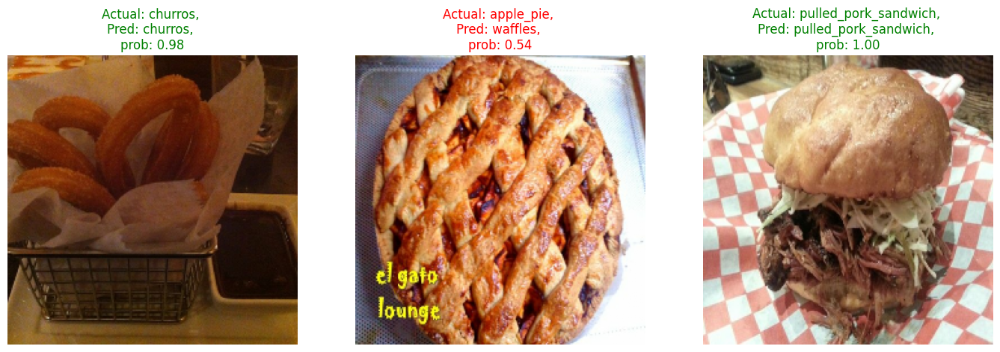

In [55]:
# Make preds on a series of random images
import os
import random

plt.figure(figsize=(17,10))
for i in range(3):
    class_name = random.choice(class_names)
    filename = random.choice(os.listdir(test_dir + "/" + class_name))
    filepath = test_dir + class_name + "/" + filename
    # Load image and make predictions
    img = load_and_prep_image(filepath, scale=False)
    pred_probs = model_3.predict(tf.expand_dims(img, axis=0))
    pred_class = class_names[pred_probs.argmax()]
    # Plot the image
    plt.subplot(1, 3, i+1)
    plt.imshow(img/255.)
    plt.axis(False)
    plt.title(f"Actual: {class_name}, \nPred: {pred_class}, \nprob: {pred_probs.max():.2f}", c="g" if pred_class==class_name else "r")

In [56]:
import random
random.choice(class_names)

'strawberry_shortcake'

## Finding the most wrong predictions

To find out where our model is most wrong, let's write some code to find out the following:
1. Get all of the image file paths in the test dataset using tensorflow dataset list_files() method
2. Create a pandas DataFrame of the image filepaths, ground truth labels, predicted classes (from our model), max prediction probabilities, prediction classes, ground truth class names.
3. Use our DataFrame to find all the wrong predictions (where the ground truth label doesn't match the prediction).
4. Use our DataFrame based on wrong predictions (have the highest prediction probability predictions at the top).
5. Visualize the images with the highest prediction probabilities but have the wrong prediction.

In [57]:
# Get all of the image files in the test dataset
filepaths = [fp.numpy() for fp in test_data.list_files("101_food_classes_10_percent/test/*/*.jpg", shuffle=False)]
#filepaths

In [58]:
len(filepaths), len(y_labels), len(pred_classes), len(preds_probs)

(25250, 25250, 25250, 25250)

In [59]:
# 2. Create DataFrame of different parameters for each of our test images
import pandas as pd
pred_df = pd.DataFrame({
    "img_path": filepaths,
    "y_true": y_labels,
    "y_pred": pred_classes,
    "pred_conf": preds_probs.max(axis=1),
    "y_true_classname": [class_names[i] for i in y_labels],
    "y_pred_classname": [class_names[i] for i in pred_classes]
})
pred_df.head()

,img_path,y_true,y_pred,pred_conf,y_true_classname,y_pred_classname
0,b'101_food_classes_10_percent/test/apple_pie/1...,0,52,0.847419,apple_pie,gyoza
1,b'101_food_classes_10_percent/test/apple_pie/1...,0,0,0.964017,apple_pie,apple_pie
2,b'101_food_classes_10_percent/test/apple_pie/1...,0,0,0.959259,apple_pie,apple_pie
3,b'101_food_classes_10_percent/test/apple_pie/1...,0,80,0.658605,apple_pie,pulled_pork_sandwich
4,b'101_food_classes_10_percent/test/apple_pie/1...,0,79,0.367903,apple_pie,prime_rib


In [60]:
# 3. Find out in out DataFrame which predictions are wrong
pred_df["pred_correct"] = pred_df["y_true"] == pred_df["y_pred"]
pred_df.head()

,img_path,y_true,y_pred,pred_conf,y_true_classname,y_pred_classname,pred_correct
0,b'101_food_classes_10_percent/test/apple_pie/1...,0,52,0.847419,apple_pie,gyoza,False
1,b'101_food_classes_10_percent/test/apple_pie/1...,0,0,0.964017,apple_pie,apple_pie,True
2,b'101_food_classes_10_percent/test/apple_pie/1...,0,0,0.959259,apple_pie,apple_pie,True
3,b'101_food_classes_10_percent/test/apple_pie/1...,0,80,0.658605,apple_pie,pulled_pork_sandwich,False
4,b'101_food_classes_10_percent/test/apple_pie/1...,0,79,0.367903,apple_pie,prime_rib,False


In [61]:
# 4. Sort our DataFrame to have most wrong predictions at the top
top_100_wrong = pred_df[pred_df["pred_correct"] == False].sort_values("pred_conf", ascending=False)[:100]
top_100_wrong.head(20)

,img_path,y_true,y_pred,pred_conf,y_true_classname,y_pred_classname,pred_correct
21810,b'101_food_classes_10_percent/test/scallops/17...,87,29,0.999997,scallops,cup_cakes,False
231,b'101_food_classes_10_percent/test/apple_pie/8...,0,100,0.999995,apple_pie,waffles,False
15359,b'101_food_classes_10_percent/test/lobster_rol...,61,53,0.999988,lobster_roll_sandwich,hamburger,False
23539,b'101_food_classes_10_percent/test/strawberry_...,94,83,0.999987,strawberry_shortcake,red_velvet_cake,False
21400,b'101_food_classes_10_percent/test/samosa/3140...,85,92,0.999981,samosa,spring_rolls,False
24540,b'101_food_classes_10_percent/test/tiramisu/16...,98,83,0.999947,tiramisu,red_velvet_cake,False
2511,b'101_food_classes_10_percent/test/bruschetta/...,10,61,0.999945,bruschetta,lobster_roll_sandwich,False
5574,b'101_food_classes_10_percent/test/chocolate_m...,22,21,0.999939,chocolate_mousse,chocolate_cake,False
17855,b'101_food_classes_10_percent/test/paella/2314...,71,65,0.999931,paella,mussels,False
23797,b'101_food_classes_10_percent/test/sushi/16593...,95,86,0.999904,sushi,sashimi,False


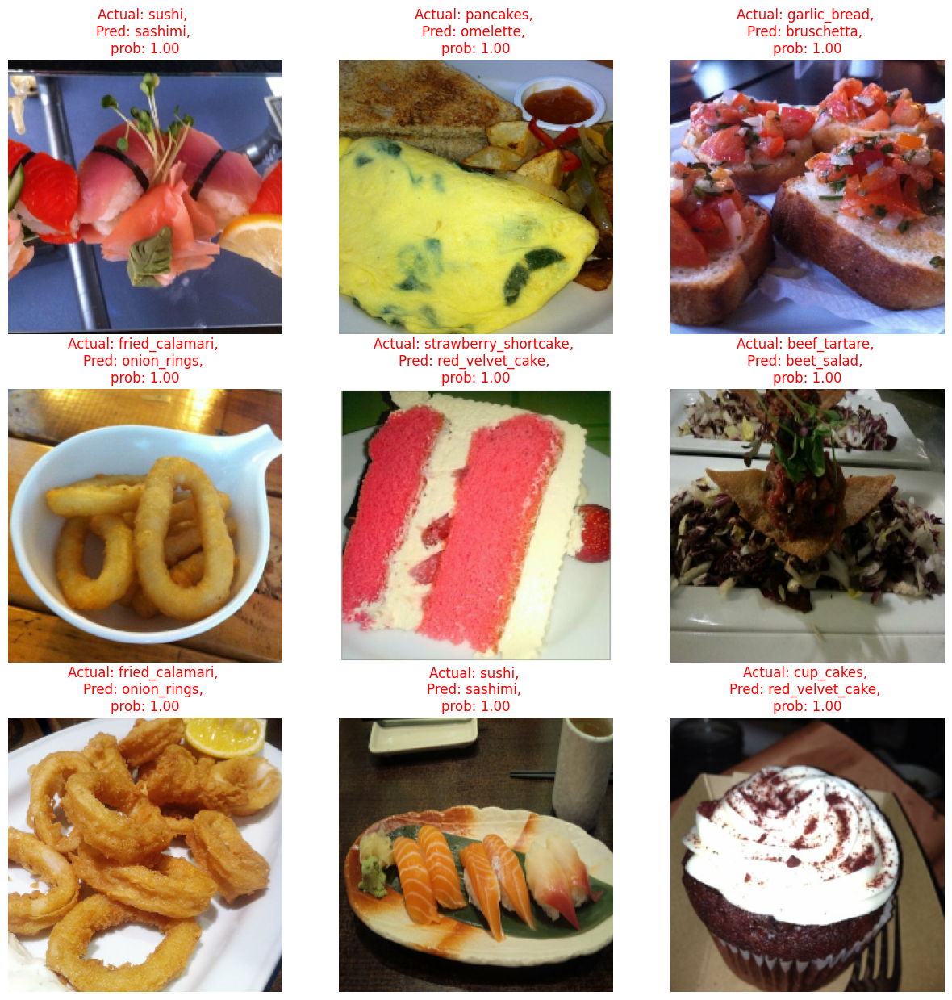

In [62]:
# 5. Visualize the test data samples which have the wrong prediction but highest pred probability
import os
import random

images_to_view = 9
start_index = 9

plt.figure(figsize=(15,15))
for i, row in enumerate(top_100_wrong[start_index:start_index+images_to_view].itertuples()):
    _, filepath, _, _, pred_prob, class_name, pred_class, _ = row
    # Load image and make predictions
    img = load_and_prep_image(filepath, scale=False)
    # Plot the image
    plt.subplot(3, 3, i+1)
    plt.imshow(img/255.)
    plt.axis(False)
    plt.title(f"Actual: {class_name}, \nPred: {pred_class}, \nprob: {pred_probs.max():.2f}", c="r")

## Test out the big dog model on our own custom images

In [63]:
# Get custom images
!rm -rf custom_food_images*
!wget https://storage.googleapis.com/ztm_tf_course/food_vision/custom_food_images.zip
unzip_data("custom_food_images.zip")
!rm -rf custom_food_images.zip

--2024-10-29 21:12:04--  https://storage.googleapis.com/ztm_tf_course/food_vision/custom_food_images.zip
Resolving storage.googleapis.com (storage.googleapis.com)... 216.58.209.187, 216.58.210.155, 216.58.209.219, ...
Connecting to storage.googleapis.com (storage.googleapis.com)|216.58.209.187|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 13192985 (13M) [application/zip]
Saving to: ‘custom_food_images.zip’

custom_food_images. 100%[===================>]  12.58M  9.92MB/s    in 1.3s    

2024-10-29 21:12:05 (9.92 MB/s) - ‘custom_food_images.zip’ saved [13192985/13192985]



In [64]:
# Get the custom food images filepaths
custom_food_images = ["custom_food_images/" + img_path for img_path in os.listdir("custom_food_images")]
custom_food_images

['custom_food_images/steak.jpeg',
 'custom_food_images/chicken_wings.jpeg',
 'custom_food_images/pizza-dad.jpeg',
 'custom_food_images/sushi.jpeg',
 'custom_food_images/ramen.jpeg',
 'custom_food_images/hamburger.jpeg']

1/1 [==============================] - 0s 13ms/step


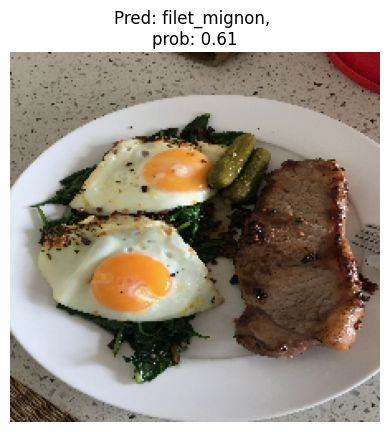

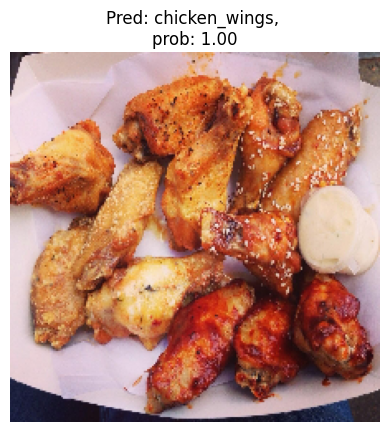

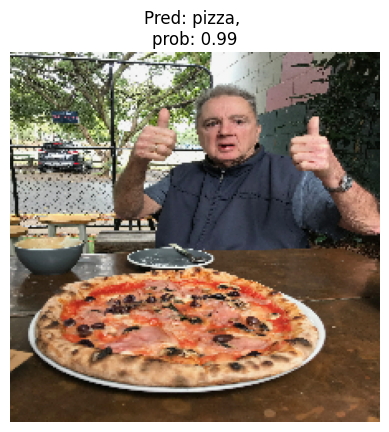

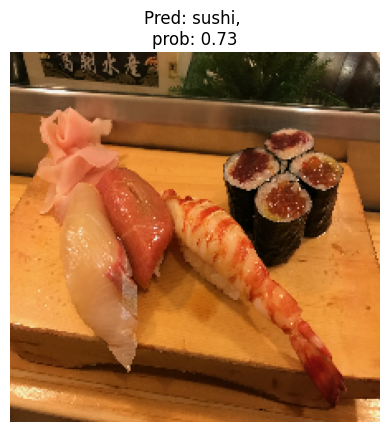

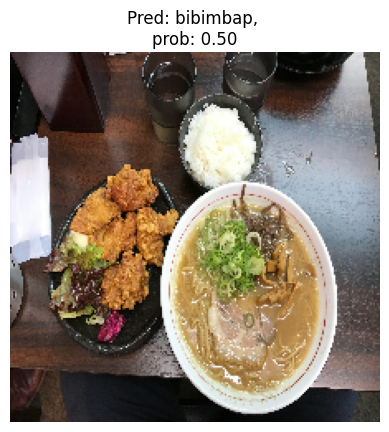

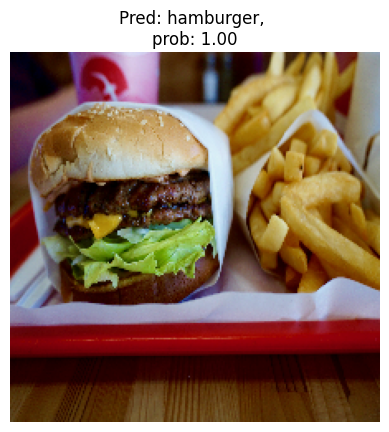

In [65]:
# make predictions and plot custom food images
for img in custom_food_images:
    img = load_and_prep_image(img, scale=False)
    pred_probs = model_3.predict(tf.expand_dims(img, axis=0))
    pred_class = class_names[pred_probs.argmax()]
    plt.figure()
    plt.imshow(img/255.)
    plt.title(f"Pred: {pred_class}, \nprob: {pred_probs.max():.2f}")
    plt.axis(False)

In [66]:
!rm -rf __MACOSX
!rm -rf 06_101_food_class_10_percent_saved_big_dog_model
!rm -rf 101_classes_10_percent_data_model_checkpoint
!rm -rf 101_food_classes_10_percent
!rm -rf custom_food_images
!rm -rf saved_model_path
!rm -rf helper_functions.py